In [1]:
#!pip install statsmodels
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from utils import load_flights, load_plane_data, load_airports_details
from utils.data_preparation import prepare_data

pd.set_option('display.max_columns', 100)
sns.set_style("whitegrid")

prepare_data()

warnings.simplefilter(action="ignore")

In [2]:
flights = load_flights(["2006", "2007", "2008"])
planes = load_plane_data()
airports = load_airports_details()
flights.memory_usage(deep=True).sum() / 1024 ** 3

1.503223163075745

In [4]:
flights.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16984354 entries, 0 to 16984353
Data columns (total 26 columns):
 #   Column             Dtype         
---  ------             -----         
 0   DayOfWeek          uint8         
 1   UniqueCarrier      category      
 2   FlightNum          uint16        
 3   TailNum            category      
 4   ActualElapsedTime  float32       
 5   CRSElapsedTime     float32       
 6   AirTime            float32       
 7   ArrDelay           float32       
 8   DepDelay           float32       
 9   Origin             category      
 10  Dest               category      
 11  Distance           uint16        
 12  TaxiIn             float32       
 13  TaxiOut            float32       
 14  Cancelled          uint8         
 15  CancellationCode   category      
 16  Diverted           uint8         
 17  CarrierDelay       float32       
 18  WeatherDelay       float32       
 19  NASDelay           float32       
 20  SecurityDelay      flo

In [5]:
planes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5029 entries, 0 to 5028
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   tailnum        5029 non-null   object  
 1   type           4480 non-null   category
 2   manufacturer   4480 non-null   category
 3   issue_date     4479 non-null   category
 4   model          4480 non-null   category
 5   status         4480 non-null   category
 6   aircraft_type  4480 non-null   category
 7   engine_type    4477 non-null   category
 8   year           4335 non-null   float32 
dtypes: category(7), float32(1), object(1)
memory usage: 123.8+ KB


In [6]:
airports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7698 entries, 0 to 7697
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   airportID  7698 non-null   int64  
 1   name       7698 non-null   object 
 2   city       7649 non-null   object 
 3   country    7698 non-null   object 
 4   iata       7698 non-null   object 
 5   icao       7698 non-null   object 
 6   lat        7698 non-null   float64
 7   lon        7698 non-null   float64
 8   altitude   7698 non-null   int64  
 9   timezone   7698 non-null   object 
 10  dst        7698 non-null   object 
 11  tz         7698 non-null   object 
 12  type       7698 non-null   object 
 13  source     7698 non-null   object 
dtypes: float64(2), int64(2), object(10)
memory usage: 842.1+ KB


In [7]:
airports.head()

,airportID,name,city,country,iata,icao,lat,lon,altitude,timezone,dst,tz,type,source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports


In [8]:
#Make tailnum column in planes categorical
planes["tailnum"] = planes["tailnum"].astype("category")
planes = planes.rename(columns={"tailnum": "TailNum"})
planes.head()

,TailNum,type,manufacturer,issue_date,model,status,aircraft_type,engine_type,year
0,N050AA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,N051AA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N052AA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,N054AA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,N055AA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:

#Merge flights with planes on tailnum
flights = flights.merge(planes, on="TailNum", how="left")
flights["DelayedDeparture"] = flights["DepDelay"] > 0
flights["DelayedArrival"] = flights["ArrDelay"] > 0
flights["Delayed"] = flights["DelayedDeparture"] | flights["DelayedArrival"]
flights.head()

,DayOfWeek,UniqueCarrier,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Departure,CRSDeparture,Arrival,CRSArrival,type,manufacturer,issue_date,model,status,aircraft_type,engine_type,year,DelayedDeparture,DelayedArrival,Delayed
0,3,US,343,N657AW,281.0,273.0,223.0,6.0,-2.0,ATL,PHX,1587,45.0,13.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 07:43:00,2006-01-11 07:45:00,2006-01-11 10:24:00,2006-01-11 10:18:00,Corporation,AIRBUS INDUSTRIE,07/09/2004,A320-232,Valid,Fixed Wing Multi-Engine,Turbo-Jet,1999.0,False,True,True
1,3,US,613,N834AW,260.0,265.0,214.0,-5.0,0.0,ATL,PHX,1587,27.0,19.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 10:53:00,2006-01-11 10:53:00,2006-01-11 13:13:00,2006-01-11 13:18:00,Corporation,AIRBUS,10/04/2004,A319-132,Valid,Fixed Wing Multi-Engine,Turbo-Fan,NaN,False,False,False
2,3,US,617,N605AW,235.0,258.0,220.0,-23.0,0.0,ATL,PHX,1587,4.0,11.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 19:15:00,2006-01-11 19:15:00,2006-01-11 21:10:00,2006-01-11 21:33:00,Corporation,AIRBUS INDUSTRIE,01/25/2000,A320-232,Valid,Fixed Wing Multi-Engine,Turbo-Jet,1997.0,False,False,False
3,3,US,300,N312AW,152.0,158.0,126.0,-8.0,-2.0,AUS,PHX,872,16.0,10.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 17:53:00,2006-01-11 17:55:00,2006-01-11 19:25:00,2006-01-11 19:33:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
4,3,US,765,N309AW,171.0,163.0,132.0,0.0,-8.0,AUS,PHX,872,27.0,12.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 08:24:00,2006-01-11 08:32:00,2006-01-11 10:15:00,2006-01-11 10:15:00,Corporation,BOEING,09/28/2005,737-3G7,Valid,Fixed Wing Multi-Engine,Turbo-Jet,1990.0,False,False,False


In [10]:
flights = flights.rename(columns={"year" : "plane_year"})
flights.columns

Index(['DayOfWeek', 'UniqueCarrier', 'FlightNum', 'TailNum',
       'ActualElapsedTime', 'CRSElapsedTime', 'AirTime', 'ArrDelay',
       'DepDelay', 'Origin', 'Dest', 'Distance', 'TaxiIn', 'TaxiOut',
       'Cancelled', 'CancellationCode', 'Diverted', 'CarrierDelay',
       'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay',
       'Departure', 'CRSDeparture', 'Arrival', 'CRSArrival', 'type',
       'manufacturer', 'issue_date', 'model', 'status', 'aircraft_type',
       'engine_type', 'plane_year', 'DelayedDeparture', 'DelayedArrival',
       'Delayed'],
      dtype='object')

In [11]:
#What plane model most delays are associated with?
delay_by_plane = pd.DataFrame(flights.groupby(["manufacturer", "model"])["Delayed"].mean() * 100)
delay_by_plane.sort_values(by="Delayed", ascending=False).head(10)

Delayed
manufacturer     model               
BOEING           777-224    89.156627
AIRBUS INDUSTRIE A330-323   84.304047
BOEING           777-232    83.317025
                 747-422    81.114130
                 767-2B7    78.749389
                 747-451    78.378378
                 767-201    76.351720
                 767-224    75.490412
AIRBUS           A321-211   73.475000
BOEING           737-924ER  73.287144

In [12]:
#What is the relationship between age of the plane and delay?
flights["Year"] = flights["Departure"].dt.year
flights["PlaneAge"] = flights["Year"] - flights["plane_year"]
flights = flights[(flights["PlaneAge"] < 100) & (flights["PlaneAge"] > 0)]
flights["PlaneAge"].describe()


count    1.356549e+07
mean     9.918264e+00
std      7.186502e+00
min      1.000000e+00
25%      5.000000e+00
50%      8.000000e+00
75%      1.500000e+01
max      5.200000e+01
Name: PlaneAge, dtype: float64

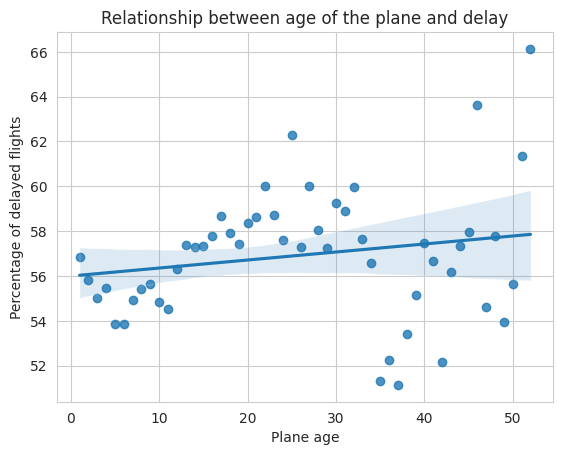

In [13]:
delay_by_age = pd.DataFrame(flights.groupby("PlaneAge")["Delayed"].mean() * 100)

sns.regplot(x=delay_by_age.index, y=delay_by_age["Delayed"], data=delay_by_age, fit_reg=True)
plt.title("Relationship between age of the plane and delay")
plt.xlabel("Plane age")
plt.ylabel("Percentage of delayed flights")
plt.savefig("../plots/age_vs_delay.png")
plt.show()

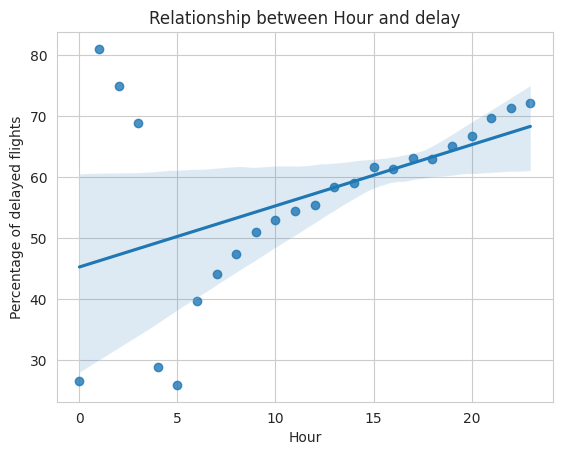

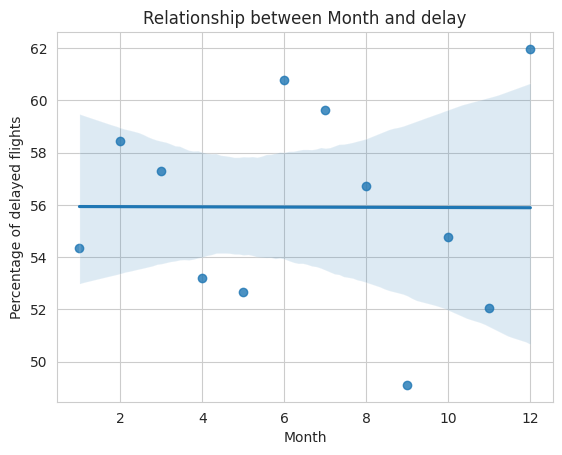

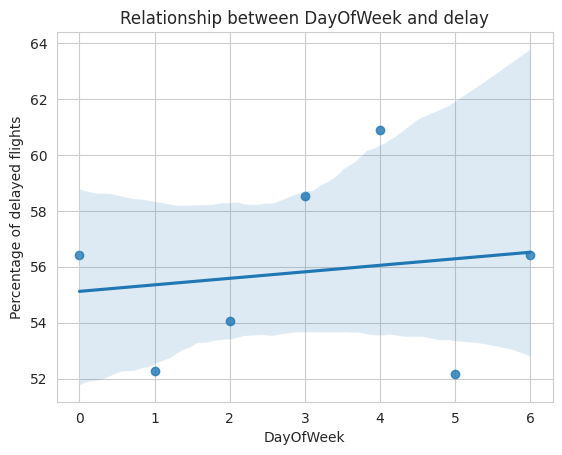

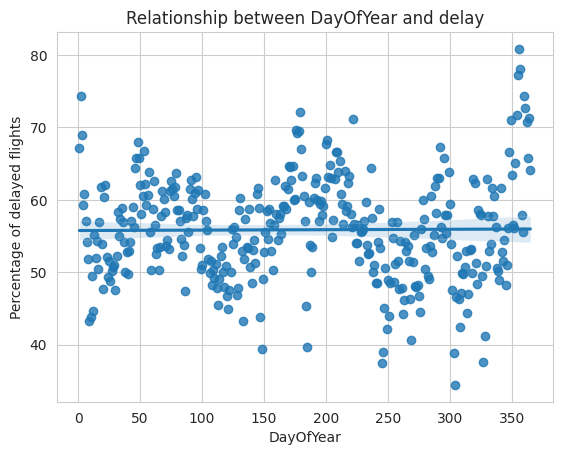

In [14]:
#What are the best and worst times to fly to minimize delays?
times = ["Hour", "Month", "DayOfWeek", "DayOfYear"]

flights["Hour"] = flights["Departure"].dt.hour
flights["Month"] = flights["Departure"].dt.month
flights["DayOfWeek"] = flights["Departure"].dt.dayofweek
flights["DayOfYear"] = flights["Departure"].dt.dayofyear

for time in times:
    delay_by_time = pd.DataFrame(flights.groupby(time)["Delayed"].mean() * 100)
    sns.regplot(x=delay_by_time.index, y=delay_by_time["Delayed"], data=delay_by_time, fit_reg=True)
    plt.title(f"Relationship between {time} and delay")
    plt.xlabel(time)
    plt.ylabel("Percentage of delayed flights")
    plt.savefig(f"../plots/{time}_vs_delay.png")
    plt.show()

In [15]:
#Create column showing the main delay reason, it compares columns: CarrierDelay, 
#WeatherDelay, NASDelay, SecurityDelay, LateAircraftDelay and chooses the one with the highest value
flights["DelayReason"] = flights[["CarrierDelay", "WeatherDelay", "NASDelay", "SecurityDelay", "LateAircraftDelay"]].idxmax(axis=1)
flights["DelayReason"].str.replace("Delay", "").value_counts()

DelayReason
Carrier         9646326
LateAircraft    1158285
NAS             1059502
Weather          128977
Security           9242
Name: count, dtype: int64

In [16]:
#Calculate average delay time for each reason
reasons = ['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay']

for reason in reasons:
    mean_delay = flights[reason].mean()
    print(f"Average delay time for {reason} is {mean_delay:.2f} minutes")

Average delay time for CarrierDelay is 4.22 minutes
Average delay time for WeatherDelay is 0.83 minutes
Average delay time for NASDelay is 4.41 minutes
Average delay time for SecurityDelay is 0.03 minutes
Average delay time for LateAircraftDelay is 5.59 minutes


In [17]:
airports.columns

Index(['airportID', 'name', 'city', 'country', 'iata', 'icao', 'lat', 'lon',
       'altitude', 'timezone', 'dst', 'tz', 'type', 'source'],
      dtype='object')

In [18]:
#Get the state in which the airport is located
airports["Location"] = airports["tz"].str.split("/").str[1]
flights = flights.merge(airports[["iata", "Location"]], left_on="Origin", right_on="iata", how="left")
flights = flights.rename(columns={"state": "OriginLoc"})
flights = flights.drop(columns="iata")
flights = flights.merge(airports[["iata", "Location"]], left_on="Dest", right_on="iata", how="left")
flights = flights.rename(columns={"state": "DestLoc"})
flights = flights.drop(columns="iata")
flights.head()

,DayOfWeek,UniqueCarrier,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Departure,CRSDeparture,Arrival,CRSArrival,type,manufacturer,issue_date,model,status,aircraft_type,engine_type,plane_year,DelayedDeparture,DelayedArrival,Delayed,Year,PlaneAge,Hour,Month,DayOfYear,DelayReason,Location_x,Location_y
0,2,US,343,N657AW,281.0,273.0,223.0,6.0,-2.0,ATL,PHX,1587,45.0,13.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 07:43:00,2006-01-11 07:45:00,2006-01-11 10:24:00,2006-01-11 10:18:00,Corporation,AIRBUS INDUSTRIE,07/09/2004,A320-232,Valid,Fixed Wing Multi-Engine,Turbo-Jet,1999.0,False,True,True,2006,7.0,7,1,11,CarrierDelay,New_York,Phoenix
1,2,US,617,N605AW,235.0,258.0,220.0,-23.0,0.0,ATL,PHX,1587,4.0,11.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 19:15:00,2006-01-11 19:15:00,2006-01-11 21:10:00,2006-01-11 21:33:00,Corporation,AIRBUS INDUSTRIE,01/25/2000,A320-232,Valid,Fixed Wing Multi-Engine,Turbo-Jet,1997.0,False,False,False,2006,9.0,19,1,11,CarrierDelay,New_York,Phoenix
2,2,US,765,N309AW,171.0,163.0,132.0,0.0,-8.0,AUS,PHX,872,27.0,12.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 08:24:00,2006-01-11 08:32:00,2006-01-11 10:15:00,2006-01-11 10:15:00,Corporation,BOEING,09/28/2005,737-3G7,Valid,Fixed Wing Multi-Engine,Turbo-Jet,1990.0,False,False,False,2006,16.0,8,1,11,CarrierDelay,Chicago,Phoenix
3,2,US,295,N733UW,127.0,122.0,108.0,2.0,-3.0,BDL,CLT,644,6.0,13.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 06:27:00,2006-01-11 06:30:00,2006-01-11 08:34:00,2006-01-11 08:32:00,Corporation,AIRBUS INDUSTRIE,04/11/2000,A319-112,Valid,Fixed Wing Multi-Engine,Turbo-Jet,2000.0,False,True,True,2006,6.0,6,1,11,CarrierDelay,New_York,New_York
4,2,US,356,N404US,133.0,123.0,121.0,7.0,-3.0,BDL,CLT,644,4.0,8.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,2006-01-11 09:42:00,2006-01-11 09:45:00,2006-01-11 11:55:00,2006-01-11 11:48:00,Corporation,BOEING,04/12/2005,737-401,Valid,Fixed Wing Multi-Engine,Turbo-Jet,1989.0,False,True,True,2006,17.0,9,1,11,CarrierDelay,New_York,New_York


In [19]:
flights = flights.rename(columns={"Location_x": "OriginLoc", "Location_y": "DestLoc"})

In [19]:
#Which locations are associated with the most often delays?
delay_by_location = pd.DataFrame(flights.groupby("OriginLoc")["Delayed"].mean() * 100)
delay_by_location.sort_values(by="Delayed", ascending=False).head(10)

,Delayed
OriginLoc,
Phoenix,57.218871
St_Thomas,56.956933
Chicago,56.861763
New_York,56.852268
Los_Angeles,55.604763
Denver,53.810278
Puerto_Rico,51.243662
Anchorage,50.401391
Adak,42.477876


In [20]:
#Which locations are associated with the most often delays?
delay_by_location = pd.DataFrame(flights.groupby("DestLoc")["Delayed"].mean() * 100)
delay_by_location.sort_values(by="Delayed", ascending=False).head(10)

,Delayed
DestLoc,
Adak,68.141593
Puerto_Rico,61.713048
St_Thomas,61.416589
Los_Angeles,58.323521
Anchorage,56.465176
New_York,56.444773
Chicago,55.953828
Phoenix,55.100484
Denver,52.924714


In [21]:
#Which departure locations are associated with the biggest average departure delay time?
delay_by_location = pd.DataFrame(flights.groupby("OriginLoc")["DepDelay"].mean())
delay_by_location.sort_values(by="DepDelay", ascending=False).head(10)

,DepDelay
OriginLoc,
Chicago,12.381458
New_York,12.005730
St_Thomas,9.895971
Phoenix,9.351537
Anchorage,9.069686
Los_Angeles,8.760744
Denver,8.190011
Puerto_Rico,7.796348
Adak,1.924528


In [22]:
#Which destination locations are associated with the biggest average arrival delay time?
delay_by_location = pd.DataFrame(flights.groupby("DestLoc")["ArrDelay"].mean())
delay_by_location.sort_values(by="ArrDelay", ascending=False).head(10)

,ArrDelay
DestLoc,
New_York,11.029252
Chicago,10.965604
Puerto_Rico,10.622474
Anchorage,9.644136
Adak,8.783019
St_Thomas,8.737162
Los_Angeles,8.273554
Denver,6.759198
Phoenix,5.656394


In [23]:
#Which locations are associated with the biggest mean of average departure and arrival delay times?
delay_by_location = pd.DataFrame(flights.groupby("OriginLoc")[["DepDelay", "ArrDelay"]].mean())
delay_by_location["MeanDelay"] = (delay_by_location["DepDelay"] + delay_by_location["ArrDelay"]) / 2
delay_by_location = delay_by_location.rename_axis("Location")
delay_by_location.sort_values(by="MeanDelay", ascending=False).head(10)

,DepDelay,ArrDelay,MeanDelay
Location,,,
Chicago,12.381458,11.429193,11.905325
New_York,12.005730,11.042230,11.523979
St_Thomas,9.895971,9.666268,9.781120
Anchorage,9.069686,7.525334,8.297510
Los_Angeles,8.760744,7.080968,7.920856
Denver,8.190011,7.641464,7.915738
Phoenix,9.351537,6.474339,7.912938
Puerto_Rico,7.796348,6.594069,7.195209
Honolulu,-0.016226,0.211398,0.097586


In [24]:
# Analyze the relationship between the average delay time and aircraft_type and engine_type

mean_delay_by_aircraft_type = pd.DataFrame(flights.groupby(["aircraft_type", "engine_type"])
                                      [["DepDelay", "ArrDelay"]].mean())
mean_delay_by_aircraft_type["MeanDelay"] = (mean_delay_by_aircraft_type["DepDelay"] + mean_delay_by_aircraft_type["ArrDelay"]) / 2
mean_delay_by_aircraft_type = mean_delay_by_aircraft_type.rename(columns={"DepDelay": "mean_dep_delay", "ArrDelay": "mean_arr_delay", "MeanDelay": "mean_delay"})
mean_delay_by_aircraft_type.sort_values(by="mean_delay", ascending=False).dropna()

mean_dep_delay  mean_arr_delay   
aircraft_type            engine_type                                     
Rotorcraft               Turbo-Shaft         13.151904       12.374250  \
Fixed Wing Single-Engine Turbo-Prop          12.922153       12.173966   
                         Reciprocating       12.653880       12.072250   
Fixed Wing Multi-Engine  Reciprocating       12.626246       11.499735   
Fixed Wing Single-Engine 4 Cycle             12.216573       11.295675   
Fixed Wing Multi-Engine  Turbo-Fan           11.227782        9.790485   
                         Turbo-Jet           10.472041        9.937351   
                         Turbo-Prop           7.426540        7.542241   
Rotorcraft               4 Cycle              7.904762        3.547619   

                                        mean_delay  
aircraft_type            engine_type                
Rotorcraft               Turbo-Shaft     12.763077  
Fixed Wing Single-Engine Turbo-Prop      12.548059  
                         Reciprocating   12.363066  
Fixed Wing Multi-Engine  Reciprocating   12.062990  
Fixed Wing Single-Engine 4 Cycle         11.756124  
Fixed Wing Multi-Engine  Turbo-Fan       10.509134  
                         Turbo-Jet       10.204697  
                         Turbo-Prop       7.484391  
Rotorcraft               4 Cycle          5.726191

In [25]:
# Analyze the relationship between the delay frequency and aircraft_type and engine_type

delay_frequency_by_aircraft_type = pd.DataFrame(flights.groupby(["aircraft_type", "engine_type"])
                                        ["Delayed"].mean() * 100)
delay_frequency_by_aircraft_type = delay_frequency_by_aircraft_type.rename(columns={"Delayed": "delayed_percentage"})
delay_frequency_by_aircraft_type["total_flights"] = flights.groupby(["aircraft_type", "engine_type"])["Delayed"].count()
delay_frequency_by_aircraft_type.sort_values(by="delayed_percentage", ascending=False).dropna()

delayed_percentage  total_flights
aircraft_type            engine_type                                     
Fixed Wing Single-Engine 4 Cycle                 58.967675           7672
Fixed Wing Multi-Engine  Turbo-Jet               57.340006        4134438
                         Reciprocating           56.284261          15141
Fixed Wing Single-Engine Turbo-Prop              56.061538           3250
Rotorcraft               Turbo-Shaft             55.978742           4516
Fixed Wing Single-Engine Reciprocating           55.749696          43611
Fixed Wing Multi-Engine  Turbo-Fan               55.668457        8842406
Rotorcraft               4 Cycle                 52.380952             42
Fixed Wing Multi-Engine  Turbo-Prop              48.413268         508183

In [26]:
flights.groupby("UniqueCarrier")["DelayReason"] == "WeatherDelay"

False

In [27]:
flights["DelayReason"].value_counts()

DelayReason
CarrierDelay         9646326
LateAircraftDelay    1158285
NASDelay             1059502
WeatherDelay          128977
SecurityDelay           9242
Name: count, dtype: int64

In [28]:
# Determine the percentage of delayed flights caused by weather conditions for each carrier, 
# and the average delay time caused by weather conditions for each carrier

weather_delay_by_carrier = pd.DataFrame(flights.groupby("UniqueCarrier")["WeatherDelay"].mean().round(2))
weather_delay_by_carrier["percentage_delayed_by_weather"] = flights.groupby("UniqueCarrier")\
["DelayReason"].apply(lambda x: (x == "WeatherDelay").mean() * 100).round(2)
weather_delay_by_carrier = weather_delay_by_carrier.rename(columns={"WeatherDelay": "mean_weather_delay"})
weather_delay_by_carrier.sort_values(by="percentage_delayed_by_weather", ascending=False).dropna()

,mean_weather_delay,percentage_delayed_by_weather
UniqueCarrier,,
OH,3.43,5.04
EV,3.14,4.03
AA,1.12,1.28
NW,0.98,1.22
MQ,1.02,1.06
OO,0.67,0.76
XE,0.82,0.75
CO,0.74,0.72
YV,0.63,0.69


In [29]:
# For each reason in DelayReason column, determine the percentage of delayed flights 
# caused by a reason for each carrier, 
# and the average delay time caused by the reason for each carrier

for reason in reasons:
    reason_delay_by_carrier = pd.DataFrame(flights.groupby("UniqueCarrier")[reason].mean().round(2))
    reason_delay_by_carrier["percentage_delayed_by_" + reason] = flights.groupby("UniqueCarrier")\
    ["DelayReason"].apply(lambda x: (x == reason).mean() * 100).round(2)
    reason_delay_by_carrier = reason_delay_by_carrier.rename(columns={reason: "mean_" + reason})
    reason_delay_by_carrier = reason_delay_by_carrier.sort_values(by="percentage_delayed_by_" + reason, ascending=False).dropna()

    print(f"                         Carriers vs {reason}\n")
    print(reason_delay_by_carrier)
    print("------------------------------------------------------------------------------")
    print()

                         Carriers vs CarrierDelay

               mean_CarrierDelay  percentage_delayed_by_CarrierDelay
UniqueCarrier                                                       
AQ                          2.03                               86.16
HA                          2.14                               84.58
OO                          5.21                               77.28
YV                          6.88                               76.96
OH                          6.30                               73.90
F9                          2.90                               73.46
DL                          3.54                               72.86
EV                          9.37                               72.81
NW                          5.62                               72.43
AS                          4.71                               70.37
AA                          4.02                               70.10
UA                          4.08                    

In [30]:
# For each , determine the percentage of delayed flights 
# caused by a reason for each aircraft_type and engine_type, 
# and the average delay time caused by the reason for each aircraft_type and engine_type

for reason in reasons:
    reason_delay_by_aircraft_type = pd.DataFrame(flights.groupby(["aircraft_type", "engine_type"])[reason].mean().round(2))
    reason_delay_by_aircraft_type["percentage_delayed_by_" + reason] = flights.groupby(["aircraft_type", "engine_type"])\
    ["DelayReason"].apply(lambda x: (x == reason).mean() * 100).round(2)
    reason_delay_by_aircraft_type = reason_delay_by_aircraft_type.rename(columns={reason: "mean_" + reason})
    reason_delay_by_aircraft_type = reason_delay_by_aircraft_type.sort_values(by="percentage_delayed_by_" + reason, ascending=False).dropna()

    print(f"                         Aircraft types vs {reason}\n")
    print(reason_delay_by_aircraft_type)
    print("------------------------------------------------------------------------------")
    print()

                         Aircraft types vs CarrierDelay

                                        mean_CarrierDelay   
aircraft_type            engine_type                        
Fixed Wing Multi-Engine  Turbo-Prop                  5.52  \
Rotorcraft               Turbo-Shaft                 4.78   
Fixed Wing Multi-Engine  Turbo-Jet                   4.31   
Fixed Wing Single-Engine Turbo-Prop                  3.90   
Fixed Wing Multi-Engine  Turbo-Fan                   4.10   
Fixed Wing Single-Engine 4 Cycle                     4.66   
                         Reciprocating               4.32   
Fixed Wing Multi-Engine  Reciprocating               4.44   
Rotorcraft               4 Cycle                     1.00   

                                        percentage_delayed_by_CarrierDelay  
aircraft_type            engine_type                                        
Fixed Wing Multi-Engine  Turbo-Prop                                  79.20  
Rotorcraft               Turbo-Shaft    

In [31]:
# What are the trends and patterns of flight delays and cancellations over time and across different carriers, airports, and routes?

# Analyze the relationship between the average delay time and the month of the year extracting the month from the Departure column

mean_delay_by_month = pd.DataFrame(flights.groupby(flights["Departure"].dt.month)[["DepDelay", "ArrDelay"]].mean())
mean_delay_by_month["MeanDelay"] = (mean_delay_by_month["DepDelay"] + mean_delay_by_month["ArrDelay"]) / 2
mean_delay_by_month = mean_delay_by_month.rename(columns={"DepDelay": "mean_dep_delay", "ArrDelay": "mean_arr_delay", "MeanDelay": "mean_delay"})
print(mean_delay_by_month.sort_values(by="mean_delay", ascending=False))
print()

# Analyze the relationship between the delay frequency and the month of the year extracting the month from the Departure column

delay_frequency_by_month = pd.DataFrame(flights.groupby(flights["Departure"].dt.month)["Delayed"].mean() * 100)
delay_frequency_by_month = delay_frequency_by_month.rename(columns={"Delayed": "delayed_percentage"})
delay_frequency_by_month["total_flights"] = flights.groupby(flights["Departure"].dt.month)["Delayed"].count()
print(delay_frequency_by_month.sort_values(by="delayed_percentage", ascending=False))

# Avg delay time vs day of week
mean_delay_by_day = pd.DataFrame(flights.groupby(flights["Departure"].dt.dayofweek)[["DepDelay", "ArrDelay"]].mean())
mean_delay_by_day["MeanDelay"] = (mean_delay_by_day["DepDelay"] + mean_delay_by_day["ArrDelay"]) / 2
mean_delay_by_day = mean_delay_by_day.rename(columns={"DepDelay": "mean_dep_delay", "ArrDelay": "mean_arr_delay", "MeanDelay": "mean_delay"})
print()
print("Average delay time vs day of week")
print(mean_delay_by_day.sort_values(by="mean_delay", ascending=False))


           mean_dep_delay  mean_arr_delay  mean_delay
Departure                                            
6               14.638411       14.297115   14.467763
12              14.500738       13.806806   14.153772
7               13.839465       12.930473   13.384970
2               12.296391       11.487222   11.891807
8               11.824243       10.894129   11.359186
3               11.472420        9.995454   10.733936
1               10.102880        8.880978    9.491929
10               9.318425        8.851007    9.084716
4                8.807569        7.310525    8.059047
5                8.451380        7.124578    7.787979
11               8.141126        6.174104    7.157615
9                7.321984        6.099874    6.710929

           delayed_percentage  total_flights
Departure                                   
12                  61.966220         960391
6                   60.786856         975553
7                   59.623241        1010195
2                 

In [32]:
#make DelayReason categorical column
flights["DelayReason"] = flights["DelayReason"].astype("category")

In [33]:
# What are the most popular origin and dest airports and routes?

# Analyze the relationship between the number of flights and the origin airport
print("Top 10 origin airports")
print(flights["Origin"].value_counts().head(10))
print()

print("Top 10 dest airports")
print(flights["Dest"].value_counts().head(10))
print()

#Sort airports by the sum of dest and origin flights
print("Top 10 airports")
top_airports = flights["Origin"].value_counts() + flights["Dest"].value_counts().sort_values(ascending=False)
print(top_airports.head(10))
print()

# Get most common routes (origin-dest)
print("Top 10 routes")
print(flights.groupby(["Origin", "Dest"])["FlightNum"].count().sort_values(ascending=False).head(10))
print()

Top 10 origin airports
Origin
ATL    867381
ORD    725039
DEN    504641
IAH    456534
DFW    444539
LAX    417598
PHX    401091
LAS    329738
EWR    324826
SLC    309318
Name: count, dtype: int64

Top 10 dest airports
Dest
ATL    864477
ORD    723331
DEN    504025
IAH    456069
DFW    443951
LAX    417370
PHX    400644
LAS    329900
EWR    324506
SLC    308929
Name: count, dtype: int64

Top 10 airports
ABE     19550.0
ABI      7030.0
ABQ    144844.0
ABY      6006.0
ACK       897.0
ACT       647.0
ACV     16075.0
ACY      2751.0
ADK       226.0
ADQ      1994.0
Name: count, dtype: float64

Top 10 routes
Origin  Dest
OGG     HNL     30496
HNL     OGG     30082
LAX     LAS     26228
LAS     LAX     25907
LIH     HNL     25106
HNL     LIH     25013
BOS     LGA     24079
LGA     BOS     24072
SFO     LAX     23168
LAX     SFO     22978
Name: FlightNum, dtype: int64



In [34]:
print("Distribution of delay reasons")
flights.DelayReason.value_counts()

Distribution of delay reasons


DelayReason
CarrierDelay         9646326
LateAircraftDelay    1158285
NASDelay             1059502
WeatherDelay          128977
SecurityDelay           9242
Name: count, dtype: int64

In [35]:
# For each origin location determine the most common DelayReason

most_common_delay_reason_by_origin = pd.DataFrame(flights.groupby("Origin")["DelayReason"].agg(lambda x: x.value_counts().index[0]))
most_common_delay_reason_by_origin = most_common_delay_reason_by_origin.rename(columns={"DelayReason": "most_common_delay_reason"})
# Print most common reasons for 15 top_airports
print("Most common delay reasons in the most popular airports")
print(most_common_delay_reason_by_origin.loc[top_airports.head(15).index])
print()

# Count each reason for each origin
print("Count of each delay reason for each origin")
print(flights.groupby(["Origin", "DelayReason"])["FlightNum"].count())
print()

Most common delay reasons in the most popular airports
    most_common_delay_reason
ABE             CarrierDelay
ABI             CarrierDelay
ABQ             CarrierDelay
ABY             CarrierDelay
ACK             CarrierDelay
ACT             CarrierDelay
ACV             CarrierDelay
ACY             CarrierDelay
ADK             CarrierDelay
ADQ             CarrierDelay
AEX             CarrierDelay
AGS             CarrierDelay
AKN             CarrierDelay
ALB             CarrierDelay
AMA             CarrierDelay

Count of each delay reason for each origin
Origin  DelayReason      
ABE     CarrierDelay         7477
        LateAircraftDelay     421
        NASDelay              798
        SecurityDelay           5
        WeatherDelay          110
                             ... 
YUM     CarrierDelay         5582
        LateAircraftDelay     362
        NASDelay              203
        SecurityDelay          31
        WeatherDelay           28
Name: FlightNum, Length: 1495, dtype:

In [36]:
# For each dest location determine the most common DelayReason

most_common_delay_reason_by_dest = pd.DataFrame(flights.groupby("Dest")["DelayReason"].agg(lambda x: x.value_counts().index[0]))
most_common_delay_reason_by_dest = most_common_delay_reason_by_dest.rename(columns={"DelayReason": "most_common_delay_reason"})
# Print most common reasons for 15 top_airports
print("Most common delay reasons in the most popular airports")
print(most_common_delay_reason_by_dest.loc[top_airports.head(15).index])
print()

# Count each reason for each dest
print("Count of each delay reason for each dest")
print(flights.groupby(["Dest", "DelayReason"])["FlightNum"].count())
print()

# For each route determine the most common DelayReason

most_common_delay_reason_by_route = pd.DataFrame(flights.groupby(["Origin", "Dest"])["DelayReason"].agg(lambda x: x.value_counts().index[0]))
most_common_delay_reason_by_route = most_common_delay_reason_by_route.rename(columns={"DelayReason": "most_common_delay_reason"})
# Print most common reasons for top 10 routes
print("Most common delay reasons in the most popular routes")
print(most_common_delay_reason_by_route.loc[flights.groupby(["Origin", "Dest"])["FlightNum"].count().sort_values(ascending=False).head(10).index])
print()

Most common delay reasons in the most popular airports
    most_common_delay_reason
ABE             CarrierDelay
ABI             CarrierDelay
ABQ             CarrierDelay
ABY             CarrierDelay
ACK             CarrierDelay
ACT             CarrierDelay
ACV             CarrierDelay
ACY             CarrierDelay
ADK             CarrierDelay
ADQ             CarrierDelay
AEX             CarrierDelay
AGS             CarrierDelay
AKN             CarrierDelay
ALB             CarrierDelay
AMA             CarrierDelay

Count of each delay reason for each dest
Dest  DelayReason      
ABE   CarrierDelay         7384
      LateAircraftDelay     798
      NASDelay              432
      SecurityDelay           5
      WeatherDelay          219
                           ... 
YUM   CarrierDelay         5814
      LateAircraftDelay     225
      NASDelay              137
      SecurityDelay           9
      WeatherDelay           53
Name: FlightNum, Length: 1545, dtype: int64

Most common delay 

In [37]:
cancellation_reasons = flights[flights["Cancelled"] == 1]["CancellationCode"].value_counts()
delay_reasons = flights[flights["Delayed"] == 1]["DelayReason"].value_counts()
print("Cancellation reasons:")
print(cancellation_reasons)
print()
print("Delay reasons:")
print(delay_reasons)

Cancellation reasons:
CancellationCode
A    45741
B    26614
C    17975
D       34
Name: count, dtype: int64

Delay reasons:
DelayReason
CarrierDelay         4563728
LateAircraftDelay    1158285
NASDelay             1059502
WeatherDelay          128977
SecurityDelay           9242
Name: count, dtype: int64


In [38]:
flights["DistanceGroup"] = pd.cut(flights["Distance"], bins=[0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000, 5500, 6000, 6500, 7000, 7500, 8000, 8500, 9000, 9500, 10000, np.inf], labels=["0-500", "501-1000", "1001-1500", "1501-2000", "2001-2500", "2501-3000", "3001-3500", "3501-4000", "4001-4500", "4501-5000", "5001-5500", "5501-6000", "6001-6500", "6501-7000", "7001-7500", "7501-8000", "8001-8500", "8501-9000", "9001-9500", "9501-10000", "10001+"])
mean_delay_by_distance = pd.DataFrame(flights.groupby(flights["DistanceGroup"])[["DepDelay", "ArrDelay"]].mean())
mean_delay_by_distance["MeanDelay"] = (mean_delay_by_distance["DepDelay"] + mean_delay_by_distance["ArrDelay"]) / 2
mean_delay_by_distance = mean_delay_by_distance.rename(columns={"DepDelay": "mean_dep_delay", "ArrDelay": "mean_arr_delay", "MeanDelay": "mean_delay"})
print("Average delay time vs distance")
print(mean_delay_by_distance.sort_values(by="mean_delay", ascending=False))

Average delay time vs distance
               mean_dep_delay  mean_arr_delay  mean_delay
DistanceGroup                                            
3001-3500           13.027144        9.241684   11.134415
501-1000            11.568981       10.354849   10.961915
1001-1500           11.176467        9.192326   10.184397
1501-2000           11.190056        9.102136   10.146095
0-500               10.211769        9.726192    9.968981
2001-2500           10.796847        8.095785    9.446316
2501-3000           10.041550        7.623671    8.832610
3501-4000            8.665770        7.519119    8.092444
4501-5000            9.660941        6.135066    7.898004
4001-4500            7.255764        1.506122    4.380943
5001-5500                 NaN             NaN         NaN
5501-6000                 NaN             NaN         NaN
6001-6500                 NaN             NaN         NaN
6501-7000                 NaN             NaN         NaN
7001-7500                 NaN            

In [39]:
airline_delays = pd.DataFrame(flights.groupby("UniqueCarrier")["Delayed"].mean() * 100)
airline_delays = airline_delays.rename(columns={"Delayed": "delayed_percentage"})
airline_cancellations = pd.DataFrame(flights.groupby("UniqueCarrier")["Cancelled"].mean() * 100)
airline_cancellations = airline_cancellations.rename(columns={"Cancelled": "cancelled_percentage"})
airline_performance = pd.concat([airline_delays, airline_cancellations], axis=1)
print(airline_performance.sort_values(by="delayed_percentage", ascending=False))

               delayed_percentage  cancelled_percentage
UniqueCarrier                                          
WN                      61.173593              0.000000
US                      60.929707              0.262418
EV                      60.525694              2.693580
F9                      59.064467              0.633392
NW                      58.796119              1.376379
CO                      58.704427              0.000000
UA                      56.894928              0.058240
MQ                      56.659298              0.000000
AA                      56.322851              0.000000
B6                      55.973074              0.290637
AS                      55.265456              1.507986
DL                      54.673057              1.509543
OH                      53.014732              0.994895
FL                      52.775197              0.935502
OO                      52.236763              0.513026
XE                      51.641215              0

In [40]:
flights["DepartureHour"] = flights["Departure"].dt.hour
mean_delay_by_hour = pd.DataFrame(flights.groupby("DepartureHour")[["DepDelay", "ArrDelay"]].mean())
mean_delay_by_hour["MeanDelay"] = (mean_delay_by_hour["DepDelay"] + mean_delay_by_hour["ArrDelay"]) / 2
mean_delay_by_hour = mean_delay_by_hour.rename(columns={"DepDelay": "mean_dep_delay", "ArrDelay": "mean_arr_delay", "MeanDelay": "mean_delay"})
print(mean_delay_by_hour.sort_values(by="mean_delay", ascending=False))

               mean_dep_delay  mean_arr_delay  mean_delay
DepartureHour                                            
3                  109.400879      111.139091  110.269989
2                  109.849365      105.753662  107.801514
1                   91.352402       86.901924   89.127167
0                   60.234493       56.636723   58.435608
23                  51.258064       47.678383   49.468224
22                  38.892452       36.612339   37.752396
21                  26.342634       24.953728   25.648182
20                  24.019682       22.367336   23.193508
19                  18.677958       17.769859   18.223907
18                  16.513388       15.706722   16.110054
17                  13.979662       13.310003   13.644833
16                  13.113209       12.218244   12.665726
15                  12.461275       11.625107   12.043191
14                  10.848377        9.820054   10.334215
13                   9.336354        8.297812    8.817083
12            

In [41]:
mean_delay_by_weather = pd.DataFrame(flights.groupby("WeatherDelay")[["DepDelay", "ArrDelay"]].mean())
mean_delay_by_weather["MeanDelay"] = (mean_delay_by_weather["DepDelay"] + mean_delay_by_weather["ArrDelay"]) / 2
mean_delay_by_weather = mean_delay_by_weather.rename(columns={"DepDelay": "mean_dep_delay", "ArrDelay": "mean_arr_delay", "MeanDelay": "mean_delay"})
print("Average delay time vs weather delay")
print(mean_delay_by_weather.sort_values(by="mean_delay", ascending=False))

Average delay time vs weather delay
              mean_dep_delay  mean_arr_delay   mean_delay
WeatherDelay                                             
1000.0           1151.000000     1180.000000  1165.500000
1163.0           1166.000000     1163.000000  1164.500000
1080.0           1120.000000     1193.000000  1156.500000
1137.0           1150.000000     1137.000000  1143.500000
1115.0           1123.000000     1128.000000  1125.500000
...                      ...             ...          ...
18.0               46.582180       54.675163    50.628670
25.0               44.262539       54.107258    49.184898
20.0               41.754803       51.326462    46.540634
15.0               41.275249       50.615421    45.945335
0.0                11.244244       10.360518    10.802382

[670 rows x 3 columns]


In [42]:
delayed_airports = pd.concat([flights[flights["Delayed"] == 1]["Origin"], flights[flights["Delayed"] == 1]["Dest"]])
delayed_airports = delayed_airports.value_counts()
cancelled_airports = pd.concat([flights[flights["Cancelled"] == 1]["Origin"], flights[flights["Cancelled"] == 1]["Dest"]])
cancelled_airports = cancelled_airports.value_counts()
print("The most common airports for delays and cancellations")
print()
print("Delayed airports:")
print(delayed_airports.head(10))
print()
print("Cancelled airports:")
print(cancelled_airports.head(10))

The most common airports for delays and cancellations

Delayed airports:
ATL    1003319
ORD     857895
DEN     566251
IAH     500794
DFW     489514
LAX     486660
PHX     458451
EWR     398896
LAS     397950
SFO     327342
Name: count, dtype: int64

Cancelled airports:
ATL    27668
ORD    12071
LGA     7886
DTW     7174
IAD     5146
DEN     5145
PHX     5056
MSP     4775
BOS     4617
CVG     3936
Name: count, dtype: int64


In [43]:
flights["FlightDuration"] = (flights["Arrival"] - flights["Departure"]).dt.total_seconds() / 60
flights["FlightDurationGroup"] = pd.cut(flights["FlightDuration"], bins=[0, 60, 120, 180, 240, 300, 360, 420, 480, 540, 600, 660, 720, 780, 840, 900, 960, 1020, 1080, 1140, 1200, np.inf], labels=["0-60", "61-120", "121-180", "181-240", "241-300", "301-360", "361-420", "421-480", "481-540", "541-600", "601-660", "661-720", "721-780", "781-840", "841-900", "901-960", "961-1020", "1021-1080", "1081-1140", "1141-1200", "1201+"])
mean_delay_by_duration = pd.DataFrame(flights.groupby("FlightDurationGroup")[["DepDelay", "ArrDelay"]].mean())
mean_delay_by_duration["MeanDelay"] = (mean_delay_by_duration["DepDelay"] + mean_delay_by_duration["ArrDelay"]) / 2
mean_delay_by_duration = mean_delay_by_duration.rename(columns={"DepDelay": "mean_dep_delay", "ArrDelay": "mean_arr_delay", "MeanDelay": "mean_delay"})
print("Flight duration vs delay time")
print()
print(mean_delay_by_duration.sort_values(by="mean_delay", ascending=False))

Flight duration vs delay time

                     mean_dep_delay  mean_arr_delay  mean_delay
FlightDurationGroup                                            
721-780                  636.000000      635.875000  635.937500
781-840                  520.285706      531.428589  525.857178
661-720                  154.523804      361.571442  258.047607
901-960                  171.000000      193.000000  182.000000
841-900                  134.600006      129.000000  131.800003
1201+                    104.491226       94.456139   99.473679
601-660                   39.577465      128.798126   84.187798
541-600                   17.126183       62.783573   39.954880
241-300                   10.868228       15.187532   13.027880
181-240                   10.635123       14.297596   12.466360
481-540                    9.296452       12.822516   11.059484
361-420                   10.065492       12.008406   11.036949
121-180                   10.780403       10.622128   10.701265
61-120   

# Clustering

In [44]:
# from sklearn.cluster import KMeans
# from sklearn.preprocessing import StandardScaler
# from sklearn.impute import SimpleImputer

# # Select relevant features for clustering
# features = ["DepDelay", "ArrDelay", "Distance"]

# # Fill in missing values with the mean of each column
# imputer = SimpleImputer()
# data = imputer.fit_transform(flights[features])

# # Standardize the data
# scaler = StandardScaler()
# data = scaler.fit_transform(data)

# # Perform KMeans clustering
# kmeans = KMeans(n_clusters=5, random_state=42)
# flights["Cluster"] = kmeans.fit_predict(data)

# Linear Regression

In [45]:
(flights["Delayed"] == 1).sum() / len(flights) * 100

55.90867883391719

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from imblearn.under_sampling import RandomUnderSampler
from scipy.stats.mstats import winsorize

In [25]:
flights["Hour"] = flights["Departure"].dt.hour

# Select relevant features for prediction
features = ["DepDelay", "Distance", "DayOfWeek", "UniqueCarrier", "Origin", "Dest", "Hour",
            "PlaneAge", "aircraft_type", "engine_type", "Month"]
cols = ["DepDelay", "Distance", "DayOfWeek", "UniqueCarrier", "Origin", "Dest", "Hour",
            "PlaneAge", "aircraft_type", "engine_type", "Month", "ArrDelay"]

# Remove rows with missing values
flights = flights.dropna(subset=cols)

data = flights[cols][:800000]

In [83]:
# #Winsoryzacja pogarsza wynik modelu :(

# # Winsorize the data to remove outliers
# data["DepDelay"] = winsorize(data["DepDelay"], limits=[0.01, 0.01])
# data["ArrDelay"] = winsorize(data["ArrDelay"], limits=[0.01, 0.01])
# data["Distance"] = winsorize(data["Distance"], limits=[0.01, 0.01])
# data["PlaneAge"] = winsorize(data["PlaneAge"], limits=[0.01, 0.01])

In [26]:
#Scale the data
scaler = StandardScaler()
data[["DepDelay", "Distance", "PlaneAge"]] = scaler.fit_transform(data[["DepDelay", "Distance", "PlaneAge"]])

# Encode categorical features
data = pd.get_dummies(data, columns=["UniqueCarrier", "Origin", "Dest", "engine_type", "aircraft_type"])

# Do sine and cosine encoding of the hour, day of week and month
data["Hour_sin"] = np.sin(data["Hour"]*(2.*np.pi/24))
data["Hour_cos"] = np.cos(data["Hour"]*(2.*np.pi/24))
data = data.drop("Hour", axis=1)
data["DayOfWeek_sin"] = np.sin(data["DayOfWeek"]*(2.*np.pi/7))
data["DayOfWeek_cos"] = np.cos(data["DayOfWeek"]*(2.*np.pi/7))
data = data.drop("DayOfWeek", axis=1)
data["Month_sin"] = np.sin((data["Month"]-1)*(2.*np.pi/12))
data["Month_cos"] = np.cos((data["Month"]-1)*(2.*np.pi/12))
data = data.drop("Month", axis=1)

In [27]:
# Undersample the data to balance the dataset
data["Delayed"] = data["ArrDelay"] > 0
rus = RandomUnderSampler(random_state=42)
data, _ = rus.fit_resample(data, data["Delayed"])

print(data["Delayed"].value_counts())
data = data.drop("Delayed", axis=1)

Delayed
False    352088
True     352088
Name: count, dtype: int64


In [28]:
# Split the data into training and testing sets
train_data, test_data, train_labels, test_labels = train_test_split(
    data.drop("ArrDelay", axis=1), data["ArrDelay"], test_size=0.2, random_state=42)

# Train a linear regression model
model = LinearRegression()
model.fit(train_data, train_labels)

# Evaluate the model on the testing set
predictions = model.predict(test_data)
mse = mean_squared_error(test_labels, predictions)
print("Mean squared error:", mse)
mae = mean_absolute_error(test_labels, predictions)
print("Mean absolute error:", mae)
rmse = np.sqrt(mse)
print("Root mean squared error:", rmse)
r2 = r2_score(test_labels, predictions)
print("R2 score:", r2)

Mean squared error: 226.48902287689813
Mean absolute error: 9.447113426282387
Root mean squared error: 15.049552248385934
R2 score: 0.8311590999314569


In [29]:
# Save the model
import pickle
with open("./models/linear_regression_800k_0.83r2_undersampled.pkl", "wb") as f:
    pickle.dump(model, f)

In [32]:
# Predict the delay for a few random flights and print the flight and prediction
for i in range(5):
    random_flight = test_data.sample()
    print("Random flight:")
    print(flights.loc[random_flight.index[0], ["UniqueCarrier", "Origin", "Dest", "Departure", "Arrival", "ArrDelay"]])
    print("Predicted delay:", model.predict(random_flight)[0])
    print("Actual delay:", test_labels[random_flight.index[0]])
    print()

Random flight:
UniqueCarrier                     UA
Origin                           SFO
Dest                             ORD
Departure        2006-01-08 10:42:00
Arrival          2006-01-08 16:42:00
ArrDelay                        -9.0
Name: 174683, dtype: object
Predicted delay: -6.574951171875
Actual delay: -6.0

Random flight:
UniqueCarrier                     UA
Origin                           FLL
Dest                             ORD
Departure        2006-01-23 06:13:00
Arrival          2006-01-23 08:15:00
ArrDelay                       -14.0
Name: 185306, dtype: object
Predicted delay: -5.183349609375
Actual delay: -19.0

Random flight:
UniqueCarrier                     MQ
Origin                           BOS
Dest                             BWI
Departure        2006-01-01 13:55:00
Arrival          2006-01-01 15:24:00
ArrDelay                        -4.0
Name: 277926, dtype: object
Predicted delay: -2.659423828125
Actual delay: -1.0

Random flight:
UniqueCarrier                 

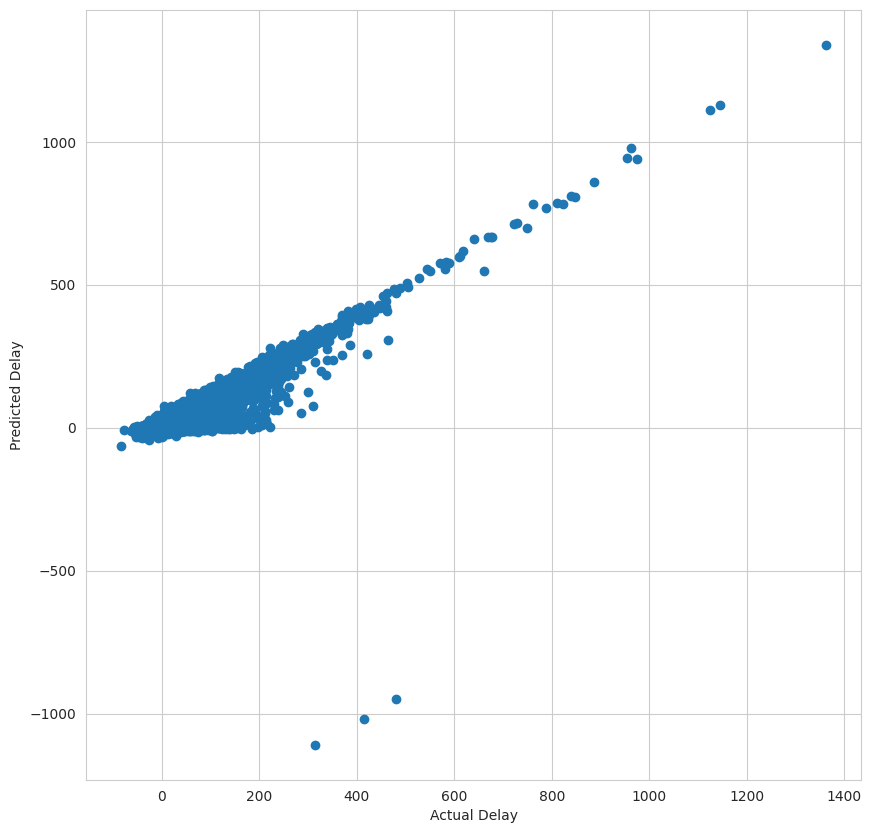

In [33]:
# Plot the actual vs predicted delay
plt.figure(figsize=(10, 10))
plt.scatter(test_labels, predictions)
plt.xlabel("Actual Delay")
plt.ylabel("Predicted Delay")
plt.savefig("../plots/actual_vs_predicted_delay.png")
plt.show()

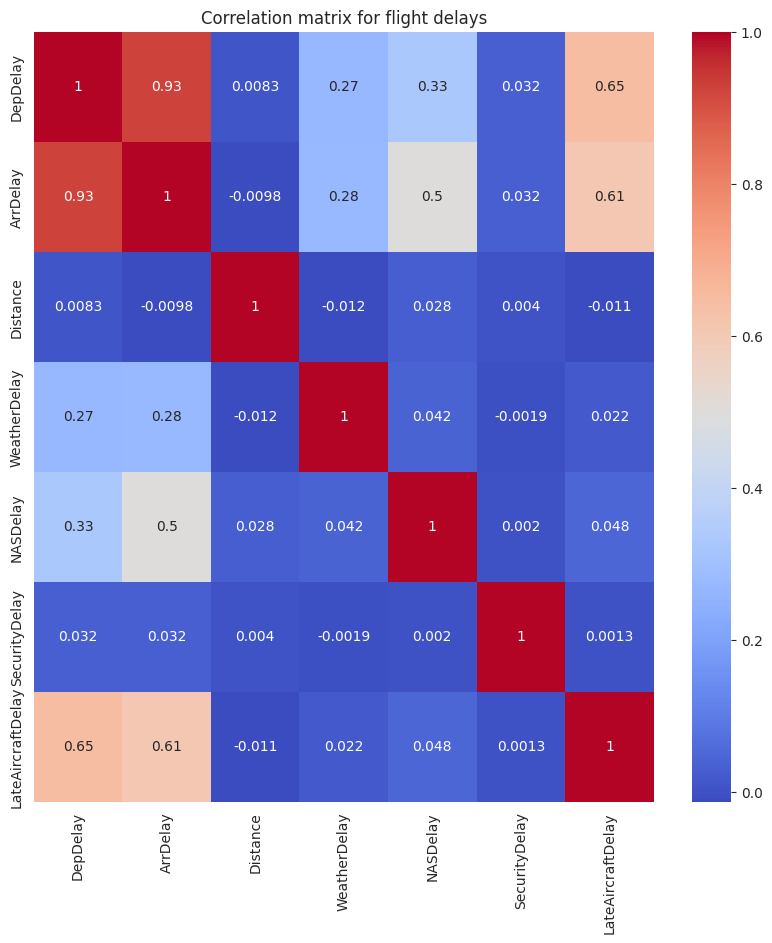

In [55]:
features = ["DepDelay", "ArrDelay", "Distance", "WeatherDelay", "NASDelay", "SecurityDelay", "LateAircraftDelay"]

corr_matrix = flights[features].corr()

plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation matrix for flight delays")
plt.savefig("../plots/delay_reasons_correlation_matrix.png")
plt.show()

# Page Rank

In [56]:
import networkx as nx

# Create a directed graph of airports and routes on a smaller subset of data
graph = nx.DiGraph()
for _, row in flights[:100000].iterrows():
    graph.add_edge(row["Origin"], row["Dest"], weight=row["Distance"])

# Compute the PageRank centrality of each airport
centrality = nx.pagerank(graph)

# Print the top 10 airports by PageRank centrality
top_airports = sorted(centrality, key=centrality.get, reverse=True)[:10]
print("Most important airports according to PageRank centrality:")
for airport in top_airports:
    print(airport, centrality[airport])

Most important airports according to PageRank centrality:
PHX 0.06157768311578246
LAS 0.04973906848057322
CVG 0.046670936869472796
DEN 0.03564864160625193
SLC 0.032081069450617464
ORD 0.031624280701629585
CLT 0.025561061157029084
MDW 0.022593954993377935
PHL 0.02109845289723674
LAX 0.020060513600105093


In [57]:
# Find the most important airports according to number of flights on the routes

data = flights[:20000]

graph = nx.DiGraph()
for _, row in data.iterrows():
    graph.add_edge(row["Origin"], row["Dest"])
    # Set weight as total number of flights on the route
    graph.add_edge(row["Origin"], row["Dest"],
                   # Set weight as total number of flights on the route
                   weight=data[(data["Origin"] == row["Origin"]) & (data["Dest"] == row["Dest"])].shape[0])
    
# Compute the PageRank centrality of each airport
centrality = nx.pagerank(graph)

# Print the top 10 airports by PageRank centrality
top_airports = sorted(centrality, key=centrality.get, reverse=True)[:10]
print("Most important airports according to number of flights on the routes:")
for airport in top_airports:
    print(airport, centrality[airport])

    


Most important airports according to number of flights on the routes:
PHX 0.15087412587949986
CLT 0.08678457266581356
LAS 0.0735872215872303
PHL 0.05073018206140891
DCA 0.03881532679760962
BOS 0.0268880241603067
PIT 0.02197702209503685
LAX 0.021274756980257936
BWI 0.01806170706515466
LGA 0.017760167358634206


# Principal Component Analysis

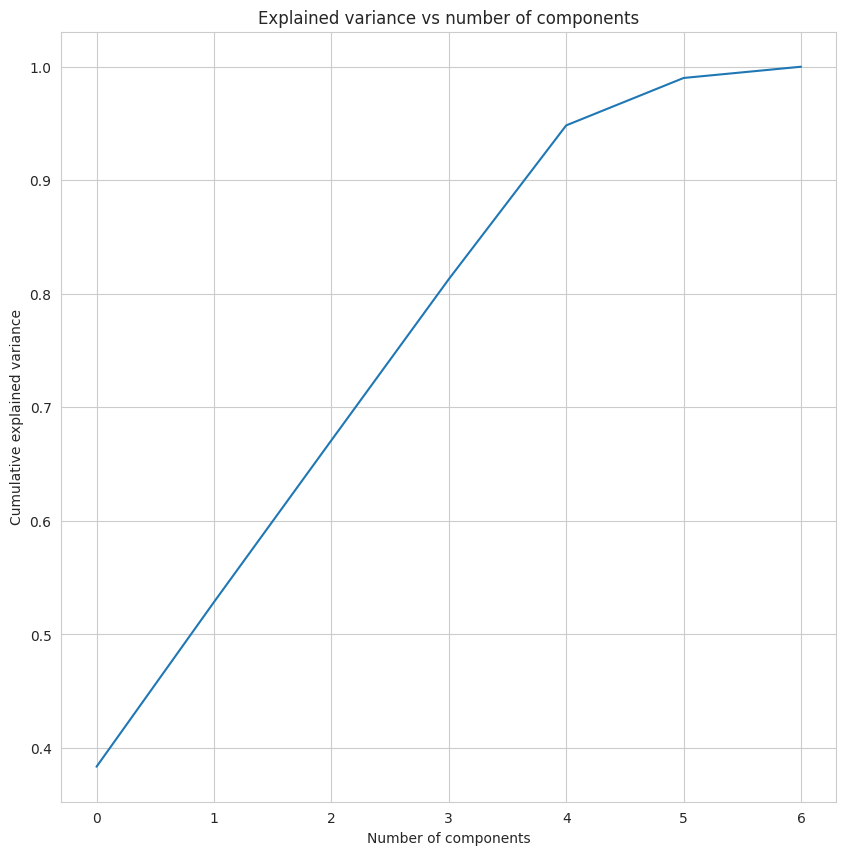

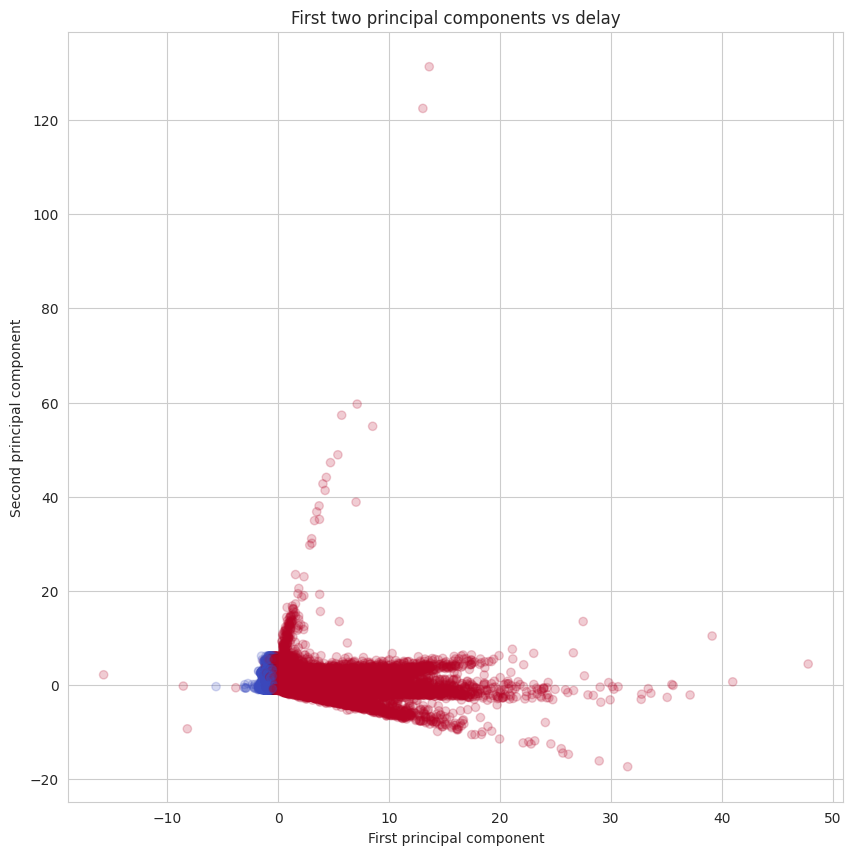

In [58]:
# apply PCA to the data

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Select relevant features for PCA
features = ["DepDelay", "ArrDelay", "Distance", "WeatherDelay", "NASDelay", "SecurityDelay", "LateAircraftDelay"]

# Remove rows with missing values
flights = flights.dropna(subset=features)

# Standardize the data
scaler = StandardScaler()
data = scaler.fit_transform(flights[features][:400000])

# Perform PCA
pca = PCA()
pca.fit(data)

# Plot the cumulative sum of the explained variance ratio
plt.figure(figsize=(10, 10))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.title("Explained variance vs number of components")
plt.savefig("../plots/cumulative_explained_variance")
plt.show()

# Perform PCA with 2 components
pca = PCA(n_components=2)
pca.fit(data)
reduced = pca.transform(data)

# Plot the first two principal components of each point
plt.figure(figsize=(10, 10))
plt.scatter(reduced[:, 0], reduced[:, 1], c=flights["Delayed"][:400000], cmap="coolwarm", alpha=0.2)
plt.xlabel("First principal component")
plt.ylabel("Second principal component")
plt.title("First two principal components vs delay")
plt.savefig("../plots/PCA_in_2D")
plt.show()



In [59]:
import plotly.express as px

data = data[:200000]

# Perform PCA with 3 components
pca = PCA(n_components=3)
pca.fit(data)
reduced = pca.transform(data)

# Create a DataFrame with the principal components
components = pd.DataFrame(reduced, columns=["PC1", "PC2", "PC3"])

# Add the delayed column to the DataFrame
components["Delayed"] = flights["Delayed"]

# Create an interactive 3D plot of the principal components
fig = px.scatter_3d(components, x="PC1", y="PC2", z="PC3", color="Delayed", opacity=0.1)
# Save the plot as an HTML file
fig.write_html("../plots/PCA_in_3D_interactive.html")
fig.show()

In [60]:
# Use PCA to determine which features contribute the most to the delays
scaler = StandardScaler()
data = scaler.fit_transform(flights[features])
pca = PCA()
pca.fit(data)

# Create a DataFrame with the features and associated principal components
components = pd.DataFrame(pca.components_.T, index=features, columns=["PC1", "PC2", "PC3", "PC4", "PC5", "PC6", "PC7"])

print("Most important features according to first principal component:")
print(components)

Most important features according to first principal component:
                        PC1       PC2       PC3       PC4       PC5       PC6   
DepDelay           0.575106 -0.042715  0.027486 -0.050920 -0.086034  0.494270  \
ArrDelay           0.588922  0.026583 -0.011336  0.014772  0.067602  0.300717   
Distance           0.000355  0.851265 -0.132267 -0.159719 -0.481799 -0.000900   
WeatherDelay       0.198766 -0.139079 -0.214907  0.790486 -0.448910 -0.260664   
NASDelay           0.300755  0.410022 -0.182410  0.213455  0.699586 -0.380250   
SecurityDelay      0.022410  0.203990  0.937249  0.279558  0.010423 -0.034320   
LateAircraftDelay  0.438132 -0.209150  0.154037 -0.472329 -0.254654 -0.671976   

                        PC7  
DepDelay          -0.642165  
ArrDelay           0.746402  
Distance           0.014554  
WeatherDelay      -0.025108  
NASDelay          -0.169061  
SecurityDelay     -0.003362  
LateAircraftDelay -0.032760  


# Time series

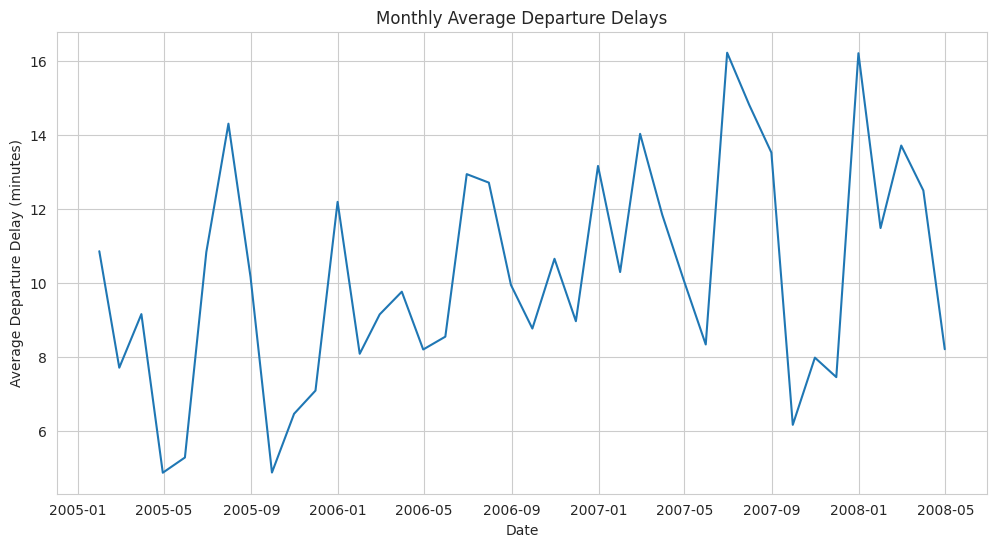

In [5]:
flights = load_flights(["2005", "2006", "2007", "2008"])
# Set the Departure column as the index
flights.set_index("Departure", inplace=True)

# Resample the data to a monthly frequency and calculate the mean delay time
monthly_delays = flights["DepDelay"].resample("M").mean()

# Plot the monthly delay times over time
plt.figure(figsize=(12, 6))
sns.lineplot(x=monthly_delays.index, y=monthly_delays)
plt.xlabel("Date")
plt.ylabel("Average Departure Delay (minutes)")
plt.title("Monthly Average Departure Delays")
plt.savefig("../plots/TIME_SERIES_average_delays_monthly.png")
plt.show()

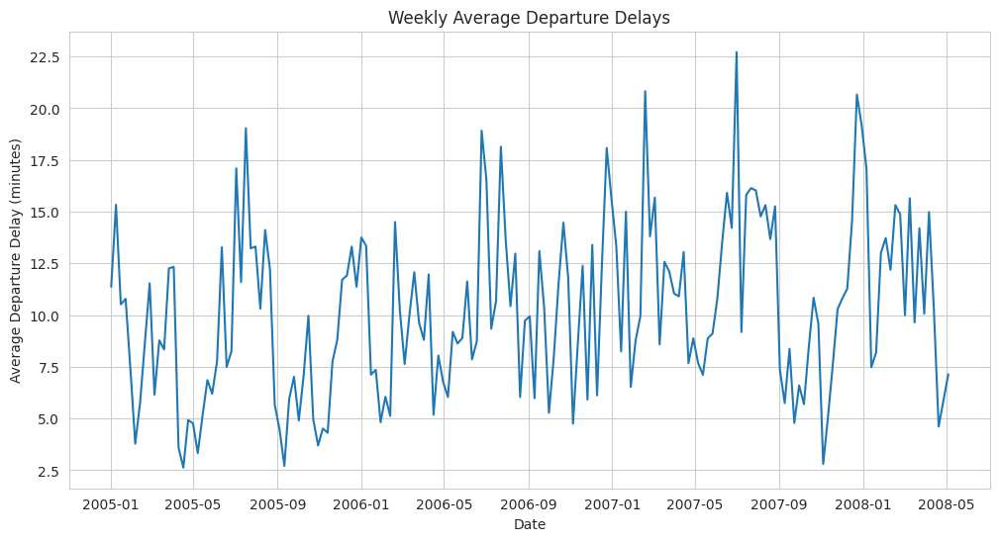

In [6]:
# Resample the data to a weekly frequency and calculate the mean delay time
weekly_delays = flights["DepDelay"].resample("W").mean()

# Plot the weekly delay times over time
plt.figure(figsize=(12, 6))
sns.lineplot(x=weekly_delays.index, y=weekly_delays)
plt.xlabel("Date")
plt.ylabel("Average Departure Delay (minutes)")
plt.title("Weekly Average Departure Delays")
plt.savefig("../plots/TIME_SERIES_average_delays_weekly.png")
plt.show()
